In [5]:
import processing as pr
from filters.blur import *
from filters.distributions import *
from filters.noise import *
from implementations.richardson_lucy import RihardsonLucy
from implementations.MAP import MAP
# from bind_dataset import bind_dataset

from algorithms.test_algorithm import TestAlgorithm
from algorithms.test2_algorithm import TestAlgorithm2
from algorithms.test3_algorithm import TestAlgorithm3



import cv2 as cv
import numpy as np

#загружаем изображения
frame = pr.Processing('images','dataset_blurred','restored')
frame.changescale(False)

# frame.read_one('white.jpg')

frame.read_one('3096.png')
# frame.read_one('fly.jpg')

# frame.bind('images\\dataset\\original\\im1.png','images\\dataset\\blurred\\im1_kernel2_img.png','images\\dataset\\kernel\\kernel2.png','kernel2',False)

# frame.bind('images\\original\\airplane.png','images\\distorted\\airplane_defocus_gaussian_poisson.png','images\\ground_truth_filters\\defocus_gaussian_kernel.png','gaussian_kernel',False)
# frame.bind('images\\original\\baboon.png','images\\distorted\\baboon_defocus_gaussian_poisson.png','images\\ground_truth_filters\\defocus_gaussian_kernel.png','gaussian_kernel',False)


#создаем фильтры
fl_gauss = GaussianNoise(1)
fl_motion = MotionBlur(gaussian_distribution, param=100.0,angle=45,kernel_length=51)
fl_defocus = DefocusBlur(gaussian_distribution, param=2,kernel_size = 61)

#создаем модели
from algorithms.HQMotionBlurRestoration.HQMBR import HQMBR
from algorithms.HQMotionBlurRestoration.convolve  import create_line_psf
predict_hqmbr = create_line_psf(np.pi, 1, (31, 31))
alg_hqmbr = HQMBR(1,predict_psf= predict_hqmbr, MAX_ITER=5)

from algorithms._23ms410_Blind_Deconvolution import _23ms410BlindDeconvolution
alg_23ms410BlindDeconvolution = _23ms410BlindDeconvolution()

from algorithms._2924878374_Variational_Bayesian_Blind_Deconvolution_Using_a_Total_Variation_Prior import TV1DeconvolutionAlgorithm
alg_TV1DeconvolutionAlgorithm = TV1DeconvolutionAlgorithm()

from algorithms.adamalavi_Blind_motion_deblurring_for_license_plates import AdamalaviBlindMotionDeblurringForLicensePlates
alg_AdamalaviBlindMotionDeblurringForLicensePlates = AdamalaviBlindMotionDeblurringForLicensePlates()

from algorithms.ADY_YDA_Iterative_Blind_Image_Deconvolution import ADYYDAIterativeBlindImageDeconvolution
alg_ADYYDAIterativeBlindImageDeconvolution = ADYYDAIterativeBlindImageDeconvolution()

from algorithms.axium_Blind_Image_Deconvolution_using_Deep_Generative_Priors import AxiumBlindImageDeconvolutionUsingDeepGenerativePriors
alg_AxiumBlindImageDeconvolutionUsingDeepGenerativePriors = AxiumBlindImageDeconvolutionUsingDeepGenerativePriors()

from algorithms.CEA_jiangming_DecGMCA import CEAJiangmingDecGMCA
alg_CEAJiangmingDecGMCA = CEAJiangmingDecGMCA(max_iter=2,sources=2)

from algorithms.ceciledellavalle_BlindDeconvolution import CeciledellavalleBlindDeconvolution
alg_CeciledellavalleBlindDeconvolution = CeciledellavalleBlindDeconvolution()

from algorithms.deu439_sbl_blind_deconvolution import Deu439SblBlindDeconvolution
alg_Deu439SblBlindDeconvolution = Deu439SblBlindDeconvolution(iterations=3)

from algorithms.dragos2001_Total_Variation_Blind_Deconvolution import Dragos2001TotalVariationBlindDeconvolution
alg_Dragos2001TotalVariationBlindDeconvolution = Dragos2001TotalVariationBlindDeconvolution()

from algorithms.Drorharush_SBD import DrorharushSBD
alg_DrorharushSBD = DrorharushSBD()

from algorithms.fabioviggiano_BlindDeconvolution import FabioviggianoBlindDeconvolution
alg_FabioviggianoBlindDeconvolution = FabioviggianoBlindDeconvolution()

from algorithms.gandor26_blind_deconvolution_through_a_single_image import Gandor26BlindDeconvolutionThroughASingleImageDeconvolutionAlgorithm
alg_Gandor26BlindDeconvolutionThroughASingleImageDeconvolutionAlgorithm = Gandor26BlindDeconvolutionThroughASingleImageDeconvolutionAlgorithm()

from algorithms.GeekLogan_pyBlindRL import GeekLoganPyBlindRL
alg_GeekLoganPyBlindRL = GeekLoganPyBlindRL()

from algorithms.gpl27_deblur import Gpl27DeblurDeconvolutionAlgorithm
alg_Gpl27DeblurDeconvolutionAlgorithm = Gpl27DeblurDeconvolutionAlgorithm()

from algorithms.jeffreysblake_funsearch_blind_deconvolution import JeffreysblakeFunsearchBlindDeconvolution
alg_JeffreysblakeFunsearchBlindDeconvolution = JeffreysblakeFunsearchBlindDeconvolution()

from algorithms.jtaoz_GKPILE_Deconvolution import JtaozGKPILEDeconvolution
alg_JtaozGKPILEDeconvolution = JtaozGKPILEDeconvolution(kernel_size=31)

from algorithms.luczeng_MotionBlur import LuczengMotionBlur
alg_LuczengMotionBlur = LuczengMotionBlur()

from algorithms.MaxMB_Image_Restoration_Wiener_Blind import MaxMBImageRestorationWienerBlind
alg_MaxMBImageRestorationWienerBlind = MaxMBImageRestorationWienerBlind()

from algorithms.muhammadhamzaazhar_Image_Enhancement_Filters import MuhammadhamzaazharImageEnhancementFilters
alg_MuhammadhamzaazharImageEnhancementFilters = MuhammadhamzaazharImageEnhancementFilters()

# unils.py не найден
# from algorithms.sanghviyashiitb_photon_limited_blind import SanghviyashiitbPhotonLimitedBlind
# alg_SanghviyashiitbPhotonLimitedBlind = SanghviyashiitbPhotonLimitedBlind()

# from algorithms.shan import #ярик, что тут импортить?

from algorithms.tianyishan_Blind_Deconvolution import TianyishanBlindDeconvolutionDeconvolutionAlgorithm
alg_TianyishanBlindDeconvolutionDeconvolutionAlgorithm = TianyishanBlindDeconvolutionDeconvolutionAlgorithm()

from algorithms.Tmodrzyk_richardson_lucy_python import TmodrzykRichardsonLucyPython
alg_TmodrzykRichardsonLucyPython = TmodrzykRichardsonLucyPython()

from algorithms.TobiasWolf_math_Blind_Deconvolution_MHDM import TobiasWolfMathBlindDeconvolutionMHDM
alg_TobiasWolfMathBlindDeconvolutionMHDM = TobiasWolfMathBlindDeconvolutionMHDM()

from algorithms.vipgugr_BCDSAR import VipgugrBCDSAR
alg_VipgugrBCDSAR = VipgugrBCDSAR()

from algorithms.warrenzha_blind_deconvolution import WarrenzhaBlindDeconvolution
alg_WarrenzhaBlindDeconvolution = WarrenzhaBlindDeconvolution()


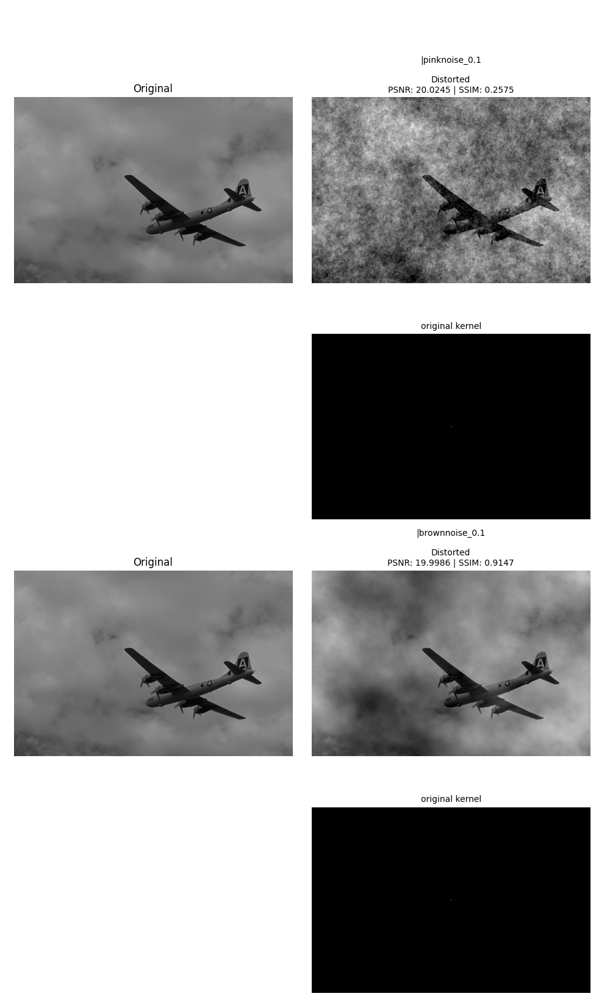

In [6]:
fl_colorednoise = ColoredNoise(0.2, 1)
fl_pinknoise = Pink_Noise(noise_level=0.1)
fl_brownnoise = Brown_Noise(noise_level=0.1)
# frame.filter(fl_colorednoise)
frame.filter(fl_pinknoise)
frame.save_filter()
frame.filter(fl_brownnoise)
frame.show()

In [ ]:
frame.load_bind_state('dataset\\dataset.json')
frame.show()

In [ ]:
#смазываем и зашумляем изображения
# frame.filter(fl_motion)
# frame.filter(fl_gauss)
# frame.save_filter()
frame.filter(fl_defocus)
frame.filter(fl_gauss)
# frame.show()

# frame.save_bind_state()


In [ ]:
frame.clear_output_directory()

Deleted: dataset_blurred\3096.png
Deleted: dataset_blurred\fly.jpg
Deleted: dataset_blurred\kernel_3096.png
Deleted: dataset_blurred\kernel_fly.jpg


In [ ]:
alg_AdamalaviBlindMotionDeblurringForLicensePlates.import_param_from_file('parametrs\\BlindMotionCNN.json')

D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
{'original': 'images\\3096.png', 'blurred': 'dataset_blurred\\3096_2.png', 'filter': '|defocus_gaussian_distribution_2_61|gaussiannoise_1', 'blurred kernel': 'dataset_blurred\\kernel_3096_2.png', 'blurred psnr': np.float64(46.87958129794815), 'blurred ssim': np.float64(0.9840790736178511), 'algorithm': 'BlindMotionCNN', 'restored': 'restored\\3096_2_BlindMotionCNN.png', 'restored kernel': 'restored\\3096_2_BlindMotionCNN_kernel.png', 'restored psnr': np.float64(10.868758646686183), 'restored ssim': nan, 'algorithm parametrs': [('angle_model_path', 'D:\\for_proga\\franework_deconvolution\\framework (9)\\algorithms\\adamalavi_Blind_motion_deblur

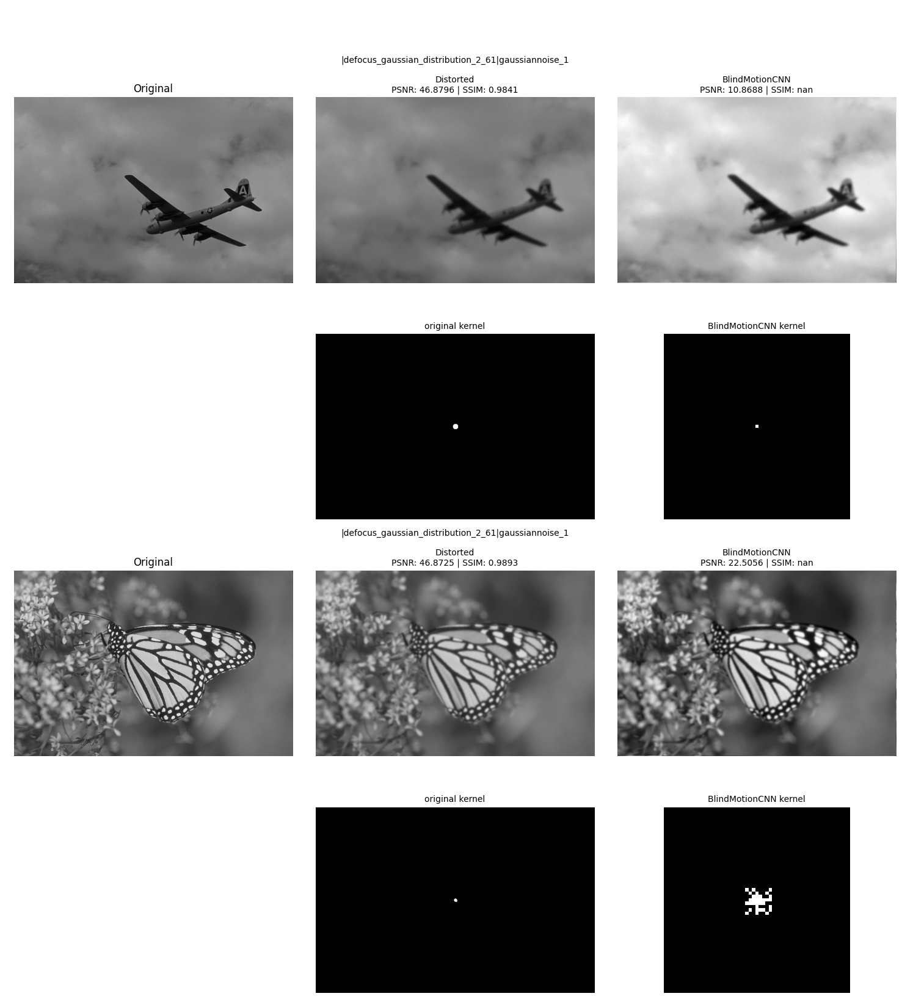

In [ ]:
frame.process(alg_AdamalaviBlindMotionDeblurringForLicensePlates, metadata=True)
frame.show(kernel_intencity_scale=1000.0)
# frame.save_bind_state()
# frame.unbind_restored()

In [ ]:
param_ranges = {
    'angle_model_path': (None,None),
    'length_model_path': (None,None),
    'noise':  (0.01, 1.0),
    'psf_size':(10,300),
    'inference_size': ((640, 480),(640, 480)),
    'fft_size': ((224, 224),(224, 224)),
    'angle_top_k': (1,20)
} 
frame.process_hyperparameter_optimization(
    algorithm_processor=alg_AdamalaviBlindMotionDeblurringForLicensePlates, 
    param_ranges=param_ranges, 
    n_trials=3,
    timeout=3600,
    logs=True
)

[I 2025-10-12 16:58:31,415] A new study created in memory with name: no-name-d7449464-33b8-4d99-bc4f-76f0d9fcb1a6
  0%|          | 0/3 [00:00<?, ?it/s]c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (640, 480) which is of type tuple.
  warnings.warn(message)
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (224, 224) which is of type tuple.
  warnings.warn(message)


D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5
D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5


Best trial: 0. Best value: 22.7313:  33%|███▎      | 1/3 [00:00<00:00,  2.47it/s, 0.40/3600 seconds]

[I 2025-10-12 16:58:31,822] Trial 0 finished with value: 22.731340663251636 and parameters: {'angle_model_path': None, 'length_model_path': None, 'noise': 0.16445845403801215, 'psf_size': 55, 'inference_size': (640, 480), 'fft_size': (224, 224), 'angle_top_k': 1}. Best is trial 0 with value: 22.731340663251636.
D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5
D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5


Best trial: 0. Best value: 22.7313:  67%|██████▋   | 2/3 [00:00<00:00,  2.51it/s, 0.80/3600 seconds]

[I 2025-10-12 16:58:32,217] Trial 1 finished with value: 22.01121958175327 and parameters: {'angle_model_path': None, 'length_model_path': None, 'noise': 0.1915704647548995, 'psf_size': 98, 'inference_size': (640, 480), 'fft_size': (224, 224), 'angle_top_k': 3}. Best is trial 0 with value: 22.731340663251636.
D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5
D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5


Best trial: 0. Best value: 22.7313: 100%|██████████| 3/3 [00:01<00:00,  2.52it/s, 1.19/3600 seconds]


[I 2025-10-12 16:58:32,608] Trial 2 finished with value: 22.72160802849371 and parameters: {'angle_model_path': None, 'length_model_path': None, 'noise': 0.20767704433677614, 'psf_size': 159, 'inference_size': (640, 480), 'fft_size': (224, 224), 'angle_top_k': 2}. Best is trial 0 with value: 22.731340663251636.
Optimization completed:
   Best PSNR: 22.7313
   Best params: {'angle_model_path': None, 'length_model_path': None, 'noise': 0.16445845403801215, 'psf_size': 55, 'inference_size': (640, 480), 'fft_size': (224, 224), 'angle_top_k': 1}
   Number of tests: 3
Best params:
   angle_model_path: D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\angle_model.hdf5
   length_model_path: D:\for_proga\franework_deconvolution\framework (9)\algorithms\adamalavi_Blind_motion_deblurring_for_license_plates\source\pretrained_models\length_model.hdf5
   noise: 0.16445845403801215
   psf_size: 55
   inference_s

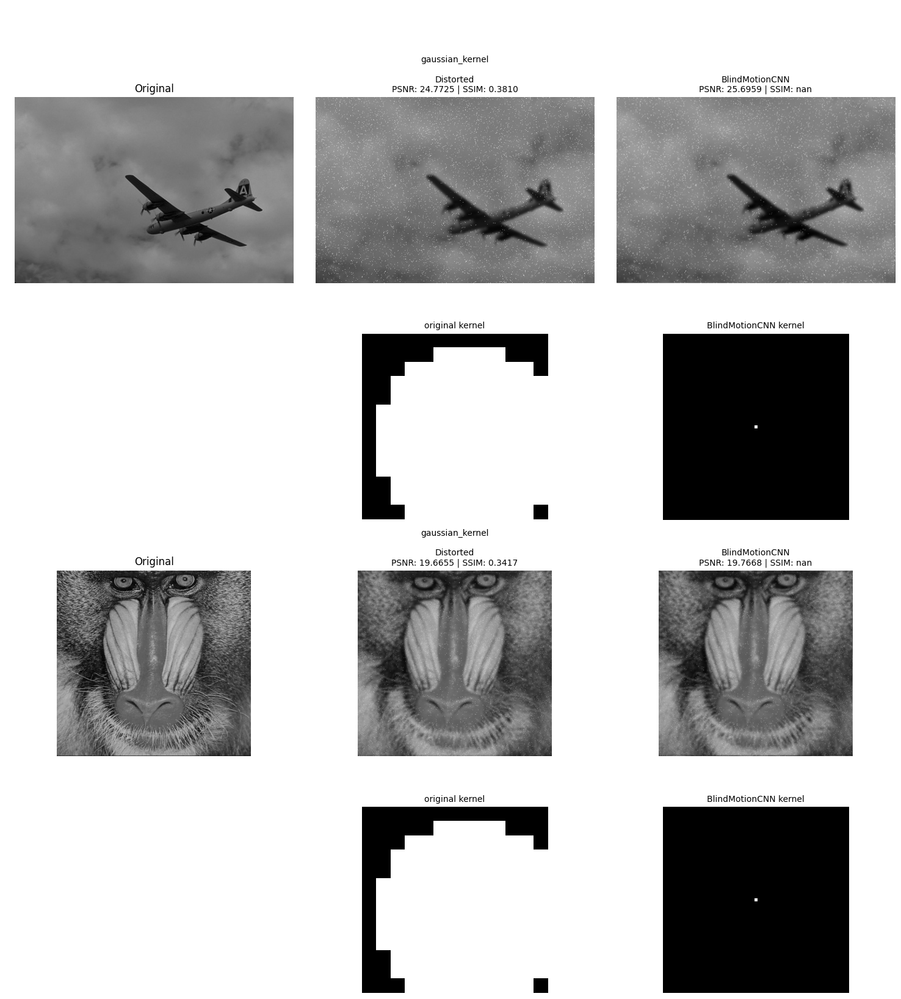

In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.unbind_restored()

In [ ]:
frame.process(alg_JtaozGKPILEDeconvolution)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: airplane_defocus_gaussian_poisson_GKPILE.png (PSNR: 20.46, SSIM: nan)


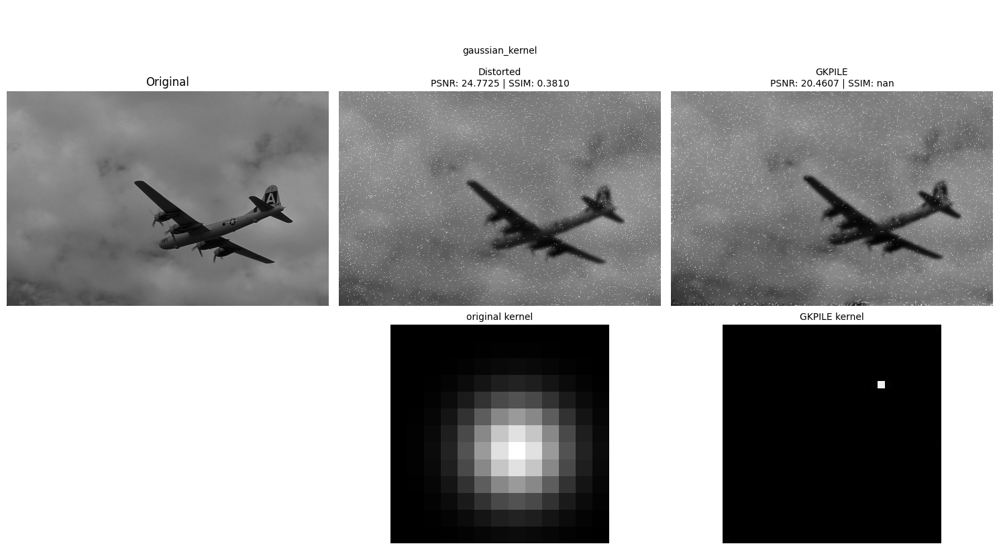

In [ ]:
frame.show(kernel_intencity_scale=1.0)
frame.unbind_restored()

In [ ]:
frame.process(alg_JtaozGKPILEDeconvolution)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_GKPILE.png (PSNR: 22.40, SSIM: nan)


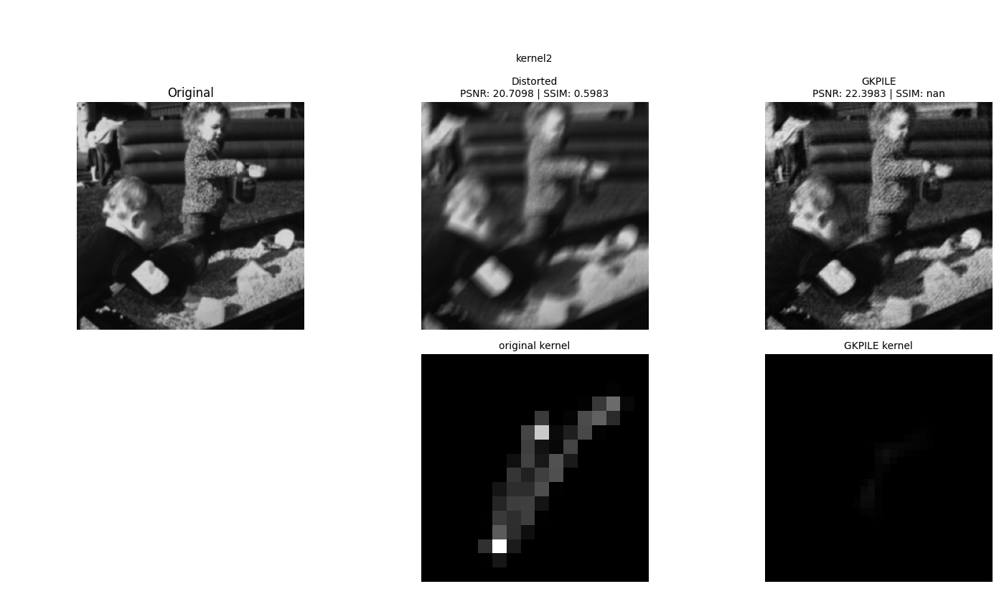

In [ ]:
frame.show(kernel_intencity_scale=1.0)
frame.unbind_restored()

In [ ]:
#восстанавливаем

param_ranges = {
    'max_iter': (1, 100),      # от 1 до 5
    'gamma': (0.01, 10.0),         # от 2 до 3
    'lambda1': (0.01, 20.0),     # от 0.5 до 1
    'k1': (0.01, 20.0),        # от 1.1 до 1.3
    'lambda2': (1, 100),     # от 10 до 25
    'k2': (0.01, 20.0),           # от 1.5 до 2
    'angle': (0.0, np.pi),
    'size': (5, 100)
} 
frame.process_hyperparameter_optimization(
    algorithm_processor=alg_hqmbr, 
    param_ranges=param_ranges, 
    n_trials=1000,
    timeout=3600,
    logs=False
)

[I 2025-09-30 14:48:13,010] A new study created in memory with name: no-name-9c4da1c1-a7ab-43e5-a444-384682c073de


Oprimizig hyperparameters for im1.png


[I 2025-09-30 14:48:46,908] Trial 0 finished with value: 9.069276533658321 and parameters: {'max_iter': 38, 'gamma': 9.507635921035062, 'lambda1': 14.642558896809986, 'k1': 11.977183099098761, 'lambda2': 16, 'k2': 3.1283304615206906, 'angle': 0.18247504928157415, 'size': 88}. Best is trial 0 with value: 9.069276533658321.
[I 2025-09-30 14:48:48,469] Trial 1 finished with value: 9.069276533658321 and parameters: {'max_iter': 61, 'gamma': 7.0836450521824945, 'lambda1': 0.4214840409730909, 'k1': 19.398497944718265, 'lambda2': 84, 'k2': 4.254658822458739, 'angle': 0.5712199812170323, 'size': 22}. Best is trial 0 with value: 9.069276533658321.
[I 2025-09-30 14:48:49,967] Trial 2 finished with value: 9.069276533658321 and parameters: {'max_iter': 31, 'gamma': 5.252316752006056, 'lambda1': 8.644580922655893, 'k1': 5.8316705125588575, 'lambda2': 62, 'k2': 2.7984822744343156, 'angle': 0.9177994816238134, 'size': 40}. Best is trial 0 with value: 9.069276533658321.
[I 2025-09-30 14:48:51,182] Tri

[I 2025-09-30 14:51:03,150] Trial 11 finished with value: 9.069276533658321 and parameters: {'max_iter': 79, 'gamma': 9.952996656492356, 'lambda1': 14.370423839013633, 'k1': 11.854040467578741, 'lambda2': 3, 'k2': 7.907400398661112, 'angle': 0.17042849903009896, 'size': 94}. Best is trial 9 with value: 13.50334997804283.
[I 2025-09-30 14:51:11,676] Trial 12 finished with value: 9.069276533658321 and parameters: {'max_iter': 29, 'gamma': 7.999429213638134, 'lambda1': 15.256293574704898, 'k1': 12.83798666300562, 'lambda2': 49, 'k2': 0.18074871166719197, 'angle': 1.472480872357241, 'size': 69}. Best is trial 9 with value: 13.50334997804283.
[I 2025-09-30 14:51:42,491] Trial 13 finished with value: 9.069276533658321 and parameters: {'max_iter': 71, 'gamma': 8.67343650963659, 'lambda1': 9.630956974390791, 'k1': 7.384512482873486, 'lambda2': 18, 'k2': 13.220505948592812, 'angle': 0.02372233586506356, 'size': 76}. Best is trial 9 with value: 13.50334997804283.
[I 2025-09-30 14:51:57,404] Tria

[I 2025-09-30 14:54:47,814] Trial 61 finished with value: 9.069276533658321 and parameters: {'max_iter': 42, 'gamma': 8.741555777721555, 'lambda1': 13.434350829377188, 'k1': 13.895809060103462, 'lambda2': 16, 'k2': 2.1011919980058282, 'angle': 0.14145135072007603, 'size': 62}. Best is trial 27 with value: 14.963395786836124.
[I 2025-09-30 14:54:49,455] Trial 62 finished with value: 5.651633819033666 and parameters: {'max_iter': 1, 'gamma': 9.56039434481057, 'lambda1': 16.95161266988711, 'k1': 12.483833831542263, 'lambda2': 25, 'k2': 2.834364815178135, 'angle': 0.4768863196900949, 'size': 99}. Best is trial 27 with value: 14.963395786836124.
[I 2025-09-30 14:54:51,750] Trial 63 finished with value: 9.069276533658321 and parameters: {'max_iter': 5, 'gamma': 9.077609578974267, 'lambda1': 15.976174984382608, 'k1': 9.333348880229693, 'lambda2': 17, 'k2': 5.516963749771261, 'angle': 0.28590296226213846, 'size': 75}. Best is trial 27 with value: 14.963395786836124.
[I 2025-09-30 14:55:18,345]

Optimization completed:
   Best PSNR: 19.0889
   Best params: {'max_iter': 1, 'gamma': 8.503188249789012, 'lambda1': 2.1381119663900177, 'k1': 9.866644086087431, 'lambda2': 22, 'k2': 9.076026890989118, 'angle': 1.4264358863204527, 'size': 5}
   Number of tests: 1000
Best params:
   max_iter: 1
   gamma: 8.503188249789012
   lambda1: 2.1381119663900177
   k1: 9.866644086087431
   lambda2: 22
   k2: 9.076026890989118
351
Error calculating SSIM: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Optimized: im1_kernel2_img_HQMBR_optimized_1.png
PSNR: 19.09, SSIM: nan


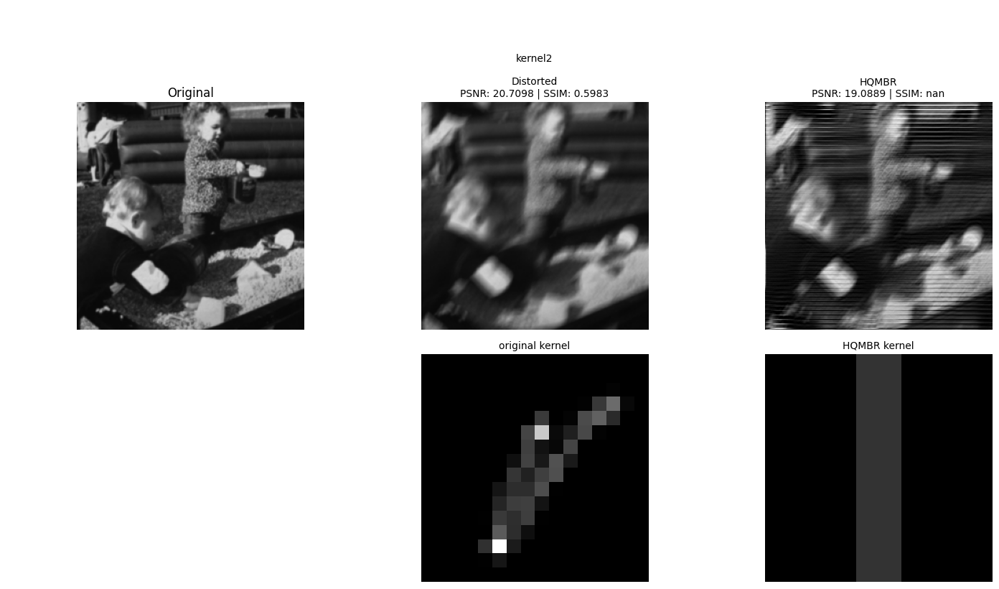

In [ ]:
frame.show(kernel_intencity_scale=1.0)
frame.unbind_restored()

In [ ]:
param_ranges = {
    'angle_model_path': (None,None),
    'length_model_path': (None,None),
    'noise':  (0.01, 1.0),
    'psf_size':(10,300),
    'inference_size': ((640, 480),(640, 480)),
    'fft_size': ((224, 224),(224, 224)),
    'angle_top_k': (1,20)
} 
frame.process_hyperparameter_optimization(
    algorithm_processor=alg_AdamalaviBlindMotionDeblurringForLicensePlates, 
    param_ranges=param_ranges, 
    n_trials=5000,
    timeout=3600
)

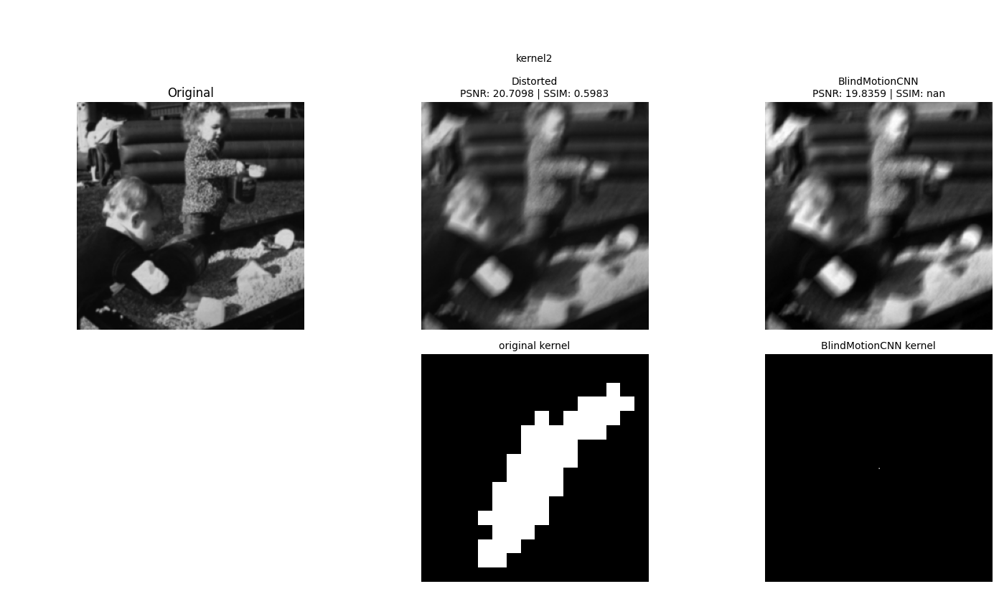

Удален файл: restored\im1_kernel2_img_BlindMotionCNN_optimized.png
Удален файл: restored\im1_kernel2_img_BlindMotionCNN_optimized_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.unbind_restored()

In [ ]:
param_ranges = {
    'iterations': (1,1000),
    'noise_ratio':(1e-6, 2.0),
    'filter_size': (5,100),
    'epsilon': (1e-8,1.0),
    'kernel_size': ((51, 51),(101, 101)),
    'relative_tolerance': (5e-6,2.0),
} 
frame.process_hyperparameter_optimization(
    algorithm_processor=alg_ADYYDAIterativeBlindImageDeconvolution, 
    param_ranges=param_ranges, 
    n_trials=1000,
    timeout=3600,
    logs=False
)

frame.process(alg_ADYYDAIterativeBlindImageDeconvolution)

[I 2025-09-30 13:39:29,762] A new study created in memory with name: no-name-1a44ab36-0035-4971-b7c6-fb2d7d39d028
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (51, 51) which is of type tuple.
  warnings.warn(message)
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\optuna\distributions.py:518: UserWarning: Choices for a categorical distribution should be a tuple of None, bool, int, float and str for persistent storage but contains (101, 101) which is of type tuple.
  warnings.warn(message)
[I 2025-09-30 13:39:29,907] Trial 0 finished with value: 10.838529139871786 and parameters: {'iterations': 375, 'noise_ratio': 1.9014286621055259, 'filter_size': 75, 'epsilon': 0.5986584882104518, 'kernel_size': (51, 51), 'relative_tolerance': 0.11617193391833809}. Best is trial 0 with

Oprimizig hyperparameters for 3096.png


[I 2025-09-30 13:39:30,058] Trial 1 finished with value: 10.838560375299622 and parameters: {'iterations': 867, 'noise_ratio': 1.2022304223714058, 'filter_size': 72, 'epsilon': 0.020584504089957503, 'kernel_size': (51, 51), 'relative_tolerance': 0.42468215966099887}. Best is trial 1 with value: 10.838560375299622.
[I 2025-09-30 13:39:30,137] Trial 2 finished with value: 10.838532497950116 and parameters: {'iterations': 182, 'noise_ratio': 0.36680983630235775, 'filter_size': 34, 'epsilon': 0.5247564363846735, 'kernel_size': (51, 51), 'relative_tolerance': 1.2237077301802854}. Best is trial 1 with value: 10.838560375299622.
[I 2025-09-30 13:39:30,211] Trial 3 finished with value: 10.838535095223133 and parameters: {'iterations': 140, 'noise_ratio': 0.5842900049257879, 'filter_size': 40, 'epsilon': 0.45606998965633605, 'kernel_size': (51, 51), 'relative_tolerance': 1.0284713056550312}. Best is trial 1 with value: 10.838560375299622.
[I 2025-09-30 13:39:30,287] Trial 4 finished with value:

Optimization completed:
   Best PSNR: 19.6879
   Best params: {'iterations': 979, 'noise_ratio': 1.1492379938352855, 'filter_size': 58, 'epsilon': 1.377641885938767e-06, 'kernel_size': (51, 51), 'relative_tolerance': 0.16632376434641216}
   Number of tests: 1000
Best params:
   iterations: 979
   noise_ratio: 1.1492379938352855
   filter_size: 58
   epsilon: 1.377641885938767e-06
   kernel_size: (51, 51)
   relative_tolerance: 0.16632376434641216
255
Error calculating SSIM: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Optimized: 3096_9_EMBlindDeconvolution_optimized.png
PSNR: 19.69, SSIM: nan
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size

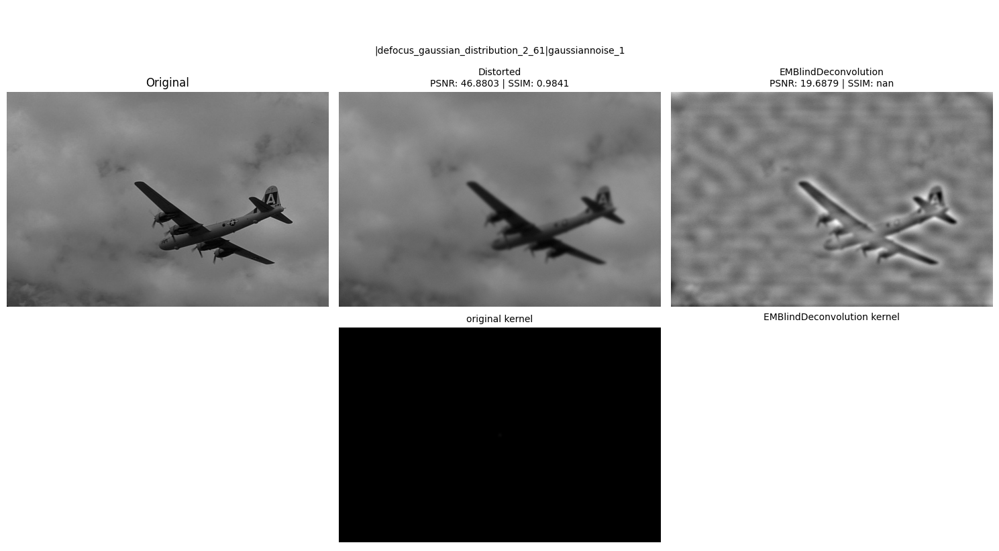

In [ ]:
frame.show(kernel_intencity_scale=1.0)
frame.unbind_restored()

In [ ]:
frame.process(alg_AxiumBlindImageDeconvolutionUsingDeepGenerativePriors)
#КУДА ДЕЛСЯ SOURCE??? ОН ТОЛЬКО ЧТО ЖЕ ЕГО ВИДЕЛ!!!
#gj[eq
#gj[eq [eqyz t,fyyfz ,kznm? cerf yf[eq
#все равно 'nf [eqyz не работает, пусть так и ,kznm остается

Restore error images\3096.png: No module named 'source'


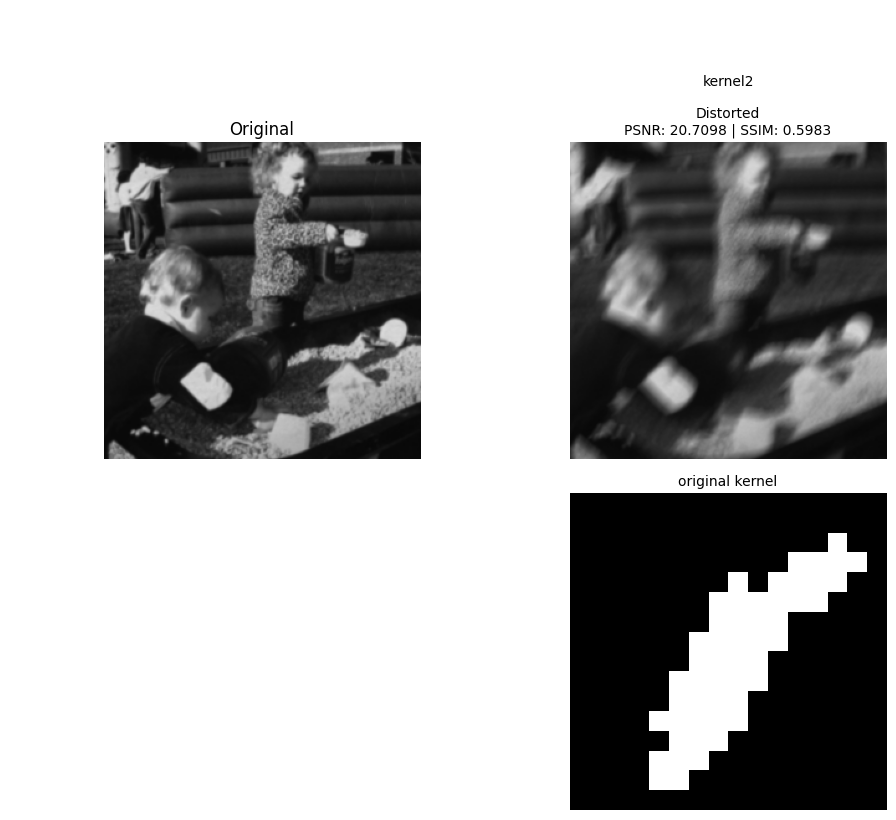

In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_CEAJiangmingDecGMCA)

Main cycle
Iteration: 1
Condition number of A:
1.0 A
Condition number of S:
1.2023695014313822e+16 S
Iteration: 2
Condition number of A:
1.0 A
Condition number of S:
7754.748234950166 S
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_DecGMCA.png (PSNR: 19.26, SSIM: nan)


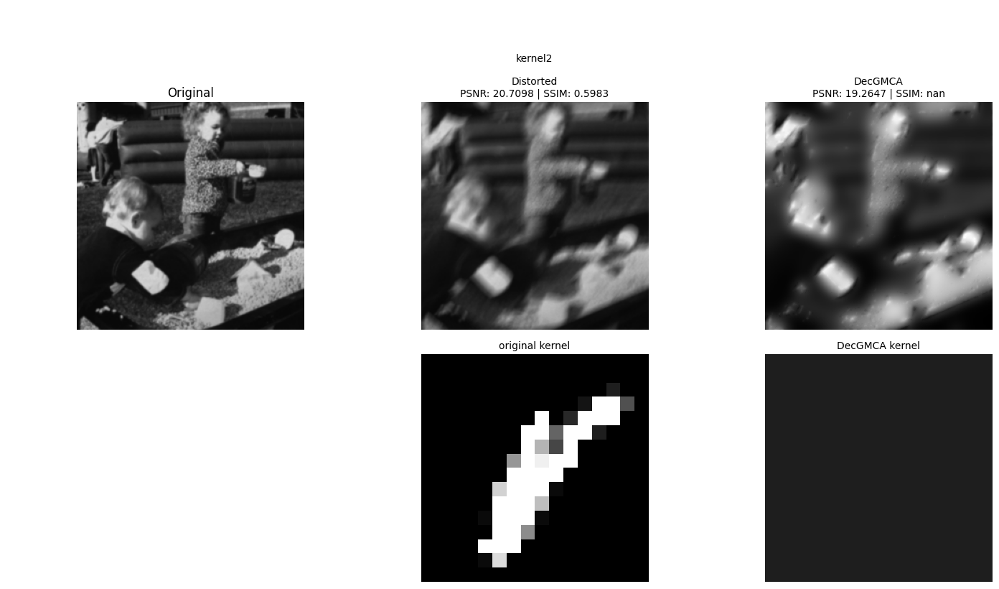

Удален файл: restored\im1_kernel2_img_DecGMCA.png
Удален файл: restored\im1_kernel2_img_DecGMCA_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=10.0)
frame.clear_restored()

In [ ]:
frame.process(alg_CeciledellavalleBlindDeconvolution)


Final energy : 72.40487771303782
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_VioletBD.png (PSNR: 20.68, SSIM: nan)


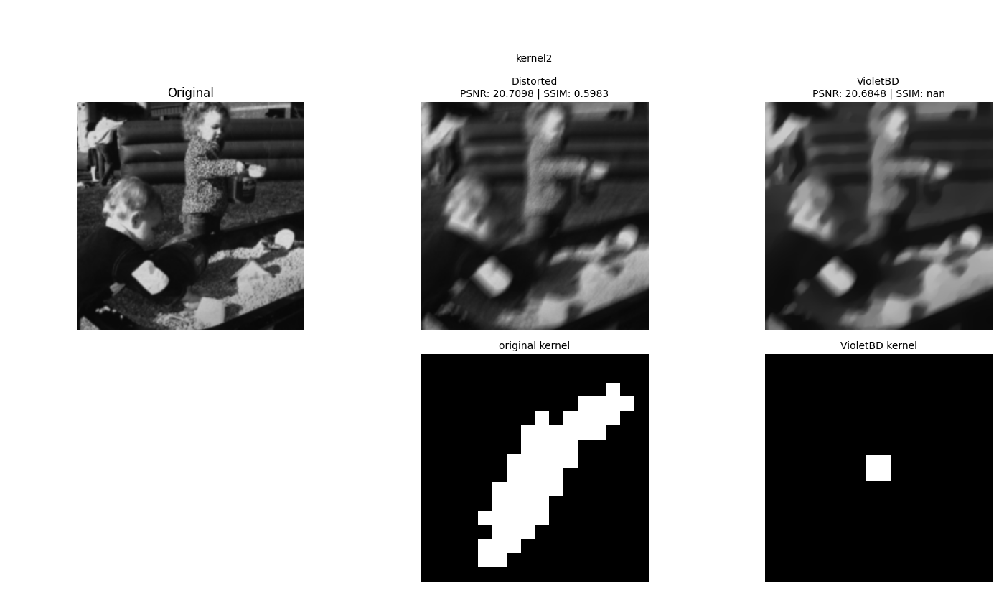

Удален файл: restored\im1_kernel2_img_VioletBD.png
Удален файл: restored\im1_kernel2_img_VioletBD_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_Deu439SblBlindDeconvolution)

Itr: 3
Iteration: 0
Itr: 3
Iteration: 1
Itr: 3
Iteration: 2
kernel_sum: 4.0
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_VariationalSBL.png (PSNR: 7.87, SSIM: nan)


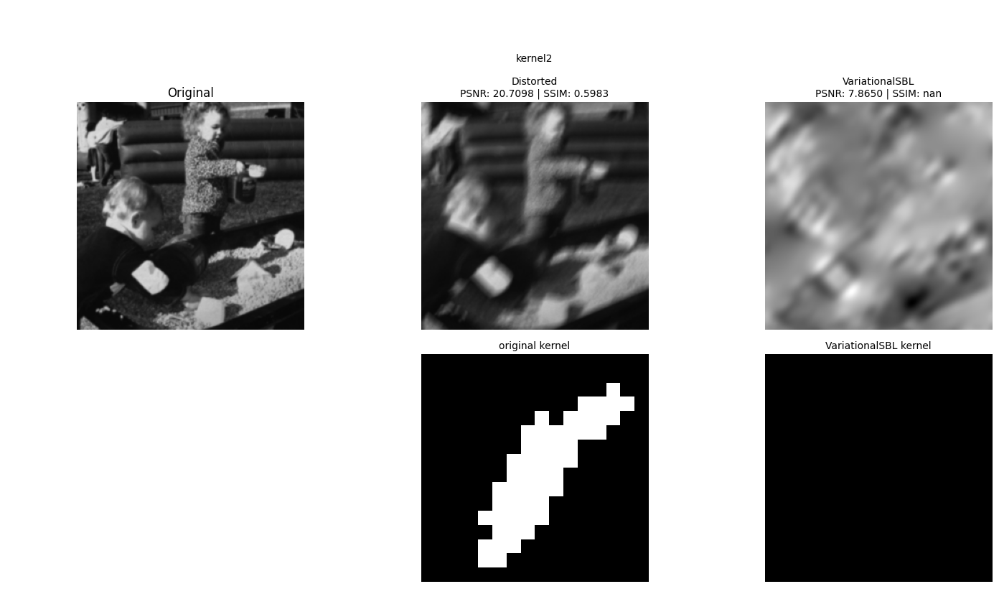

Удален файл: restored\im1_kernel2_img_VariationalSBL_kernel.png
Удален файл: restored\im1_kernel2_img_VariationalSBL.png


In [ ]:
frame.show(kernel_intencity_scale=1000000000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_Dragos2001TotalVariationBlindDeconvolution)
#???

1.0
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_TotalVariationBlindTV.png (PSNR: 20.76, SSIM: nan)


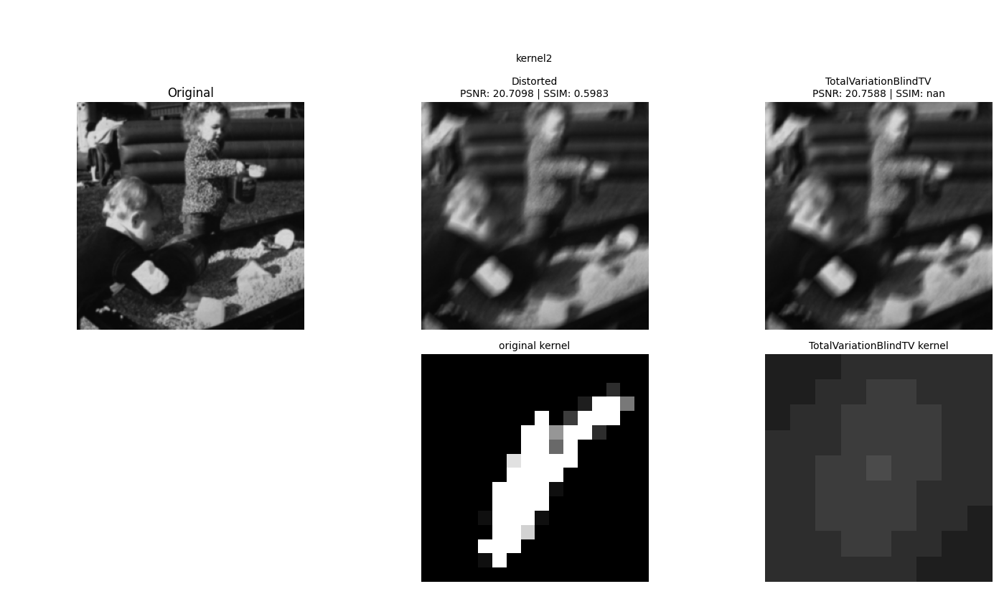

Удален файл: restored\im1_kernel2_img_TotalVariationBlindTV.png
Удален файл: restored\im1_kernel2_img_TotalVariationBlindTV_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=15.0)
frame.clear_restored()

In [ ]:
frame.process(alg_DrorharushSBD)
#yt t,e ,kznm как это фиксить?

Restore error images\dataset\original\im1.png: VJP of asarray wrt argnums (0,) not defined


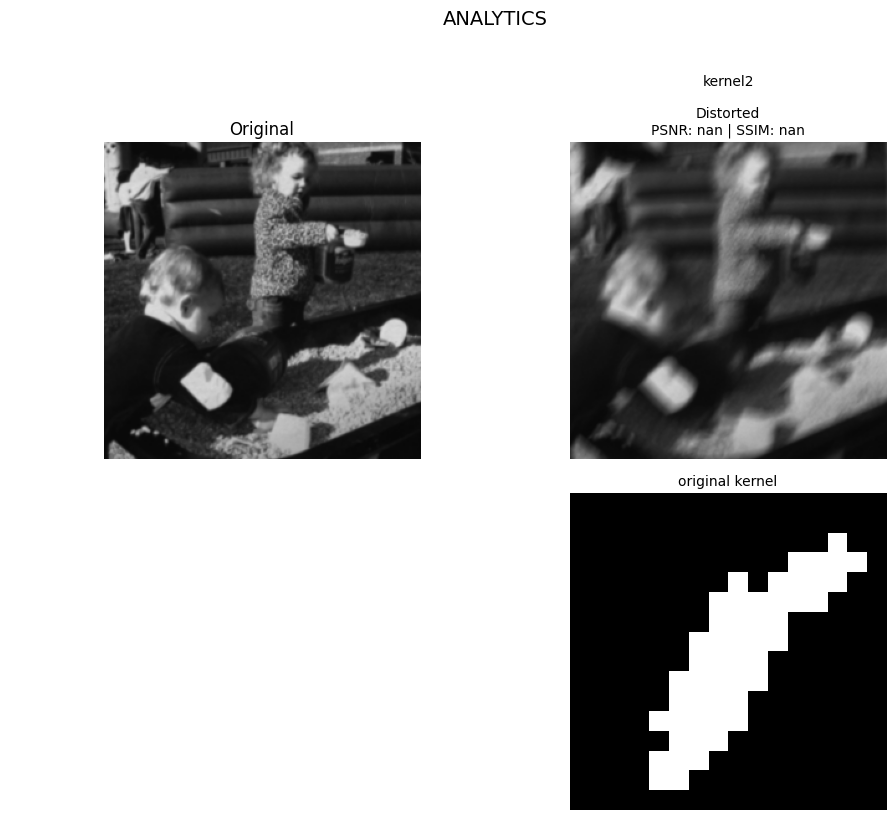

In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_FabioviggianoBlindDeconvolution)

Inizio deconvolution con l'algoritmo di Shan (Piramidale v2.1)...
--- Processando livello piramidale 1/4 (Dimensioni: (32, 32)) ---
--- Processando livello piramidale 2/4 (Dimensioni: (64, 64)) ---
--- Processando livello piramidale 3/4 (Dimensioni: (128, 128)) ---
--- Processando livello piramidale 4/4 (Dimensioni: (255, 255)) ---
Stima finale del kernel completata. Eseguo deconvolution finale sull'immagine originale...
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_Shan.png (PSNR: 9.26, SSIM: nan)


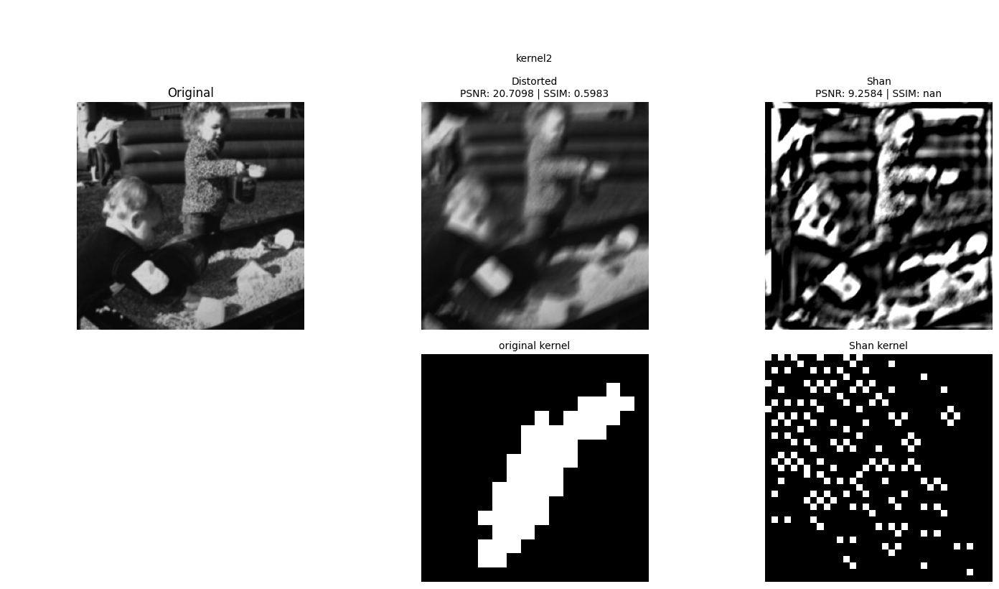

Удален файл: restored\im1_kernel2_img_Shan_kernel.png
Удален файл: restored\im1_kernel2_img_Shan.png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
# frame.process(alg_Gandor26BlindDeconvolutionThroughASingleImageDeconvolutionAlgorithm)

d:\for_proga\franework_deconvolution\framework (8)\algorithms\gandor26_blind_deconvolution_through_a_single_image\deconvolution.py:178: RuntimeWarning: overflow encountered in multiply
  + self.gamma * np.conj(self.F_grad_x) * F_psi_x
d:\for_proga\franework_deconvolution\framework (8)\algorithms\gandor26_blind_deconvolution_through_a_single_image\deconvolution.py:179: RuntimeWarning: overflow encountered in multiply
  + self.gamma * np.conj(self.F_grad_y) * F_psi_y
d:\for_proga\franework_deconvolution\framework (8)\algorithms\gandor26_blind_deconvolution_through_a_single_image\deconvolution.py:186: RuntimeWarning: invalid value encountered in divide
  F_L = numerator / denominator
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\numpy\fft\_pocketfft.py:94: RuntimeWarning: invalid value encountered in ifft
  return ufunc(a, fct, axes=[(axis,), (), (axis,)], out=out)
d:\for_proga\franework_deconvolution\framework (8)\algorithms\gandor26_blind_deconvolution_through_

KeyboardInterrupt: 

In [ ]:
# frame.show(kernel_intencity_scale=1000.0)
# frame.clear_restored()

In [ ]:
frame.process(alg_GeekLoganPyBlindRL)
#151 ломается

Restore error images\dataset\original\im1.png: result type ComplexFloat can't be cast to the desired output type Float


d:\for_proga\franework_deconvolution\framework (8)\algorithms\GeekLogan_pyBlindRL\source\src\pyBlindRL\commands.py:123: ComplexWarning: Casting complex values to real discards the imaginary part
  out[...] += psf.astype(np.float32)


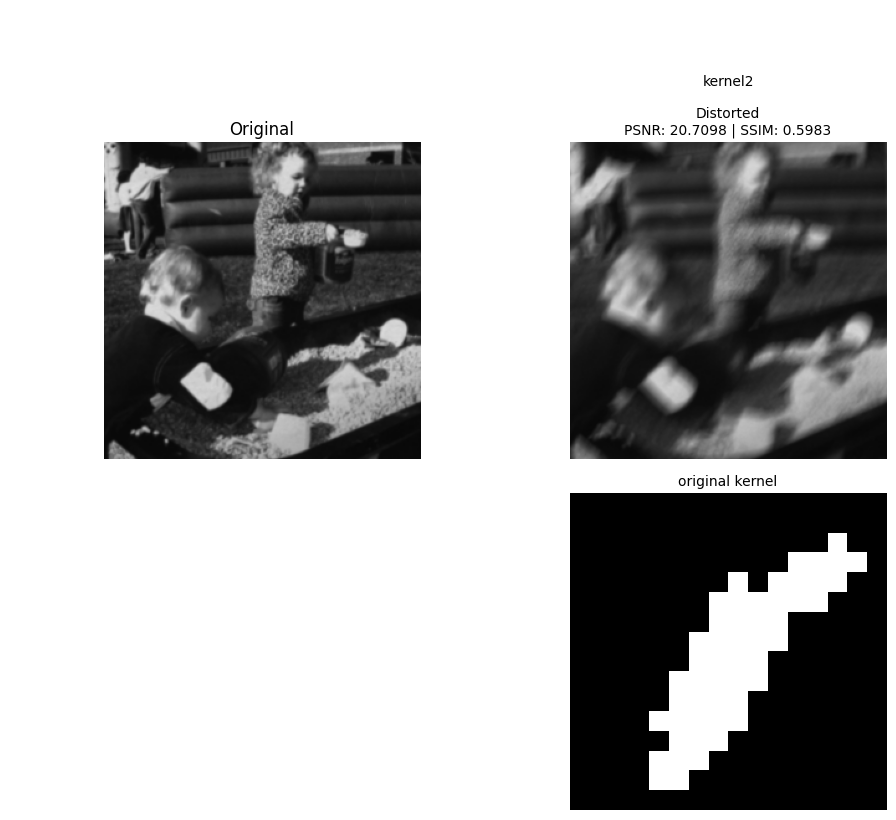

In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_Gpl27DeblurDeconvolutionAlgorithm)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_High-Quality Motion Deblurring (gpl27).png (PSNR: 8.85, SSIM: nan)


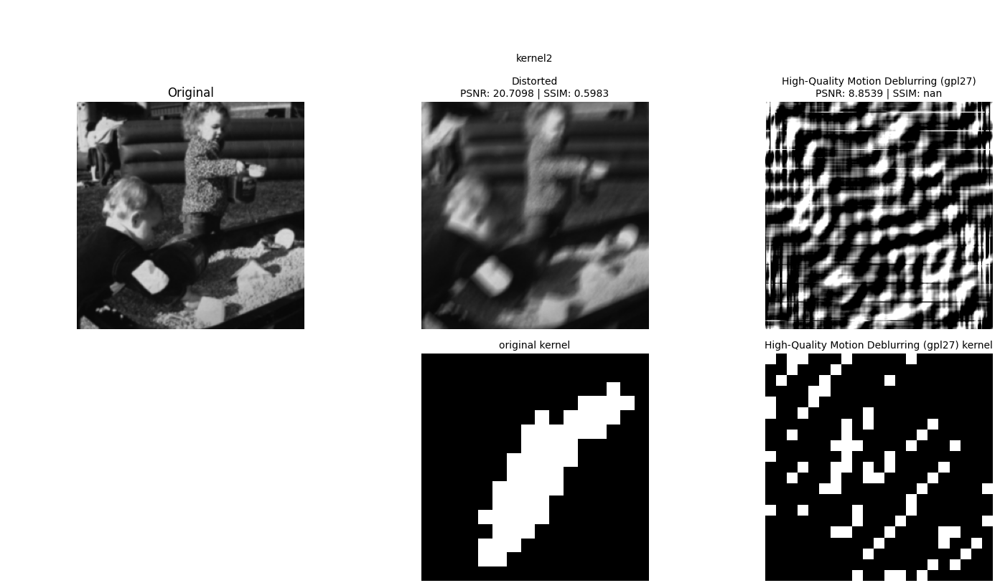

Удален файл: restored\im1_kernel2_img_High-Quality Motion Deblurring (gpl27)_kernel.png
Удален файл: restored\im1_kernel2_img_High-Quality Motion Deblurring (gpl27).png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_JeffreysblakeFunsearchBlindDeconvolution)
#долго, ставить меньше итераций

1.0
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_FunsearchRLStopping.png (PSNR: 18.59, SSIM: nan)


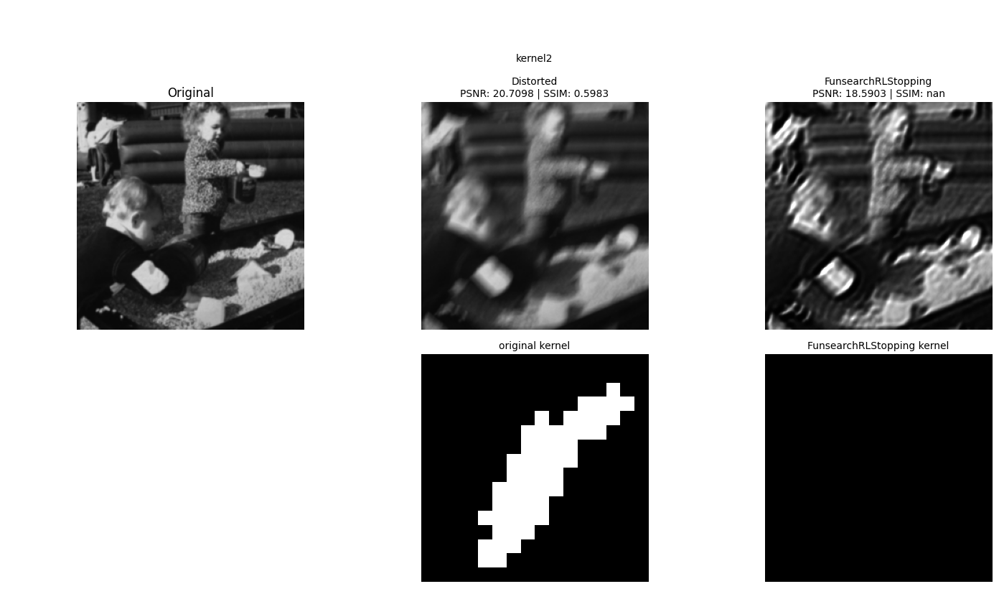

Удален файл: restored\im1_kernel2_img_FunsearchRLStopping.png
Удален файл: restored\im1_kernel2_img_FunsearchRLStopping_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=100.0)
frame.clear_restored()

In [ ]:
frame.process(alg_JtaozGKPILEDeconvolution)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: 3096_10_GKPILE.png (PSNR: 30.74, SSIM: nan)


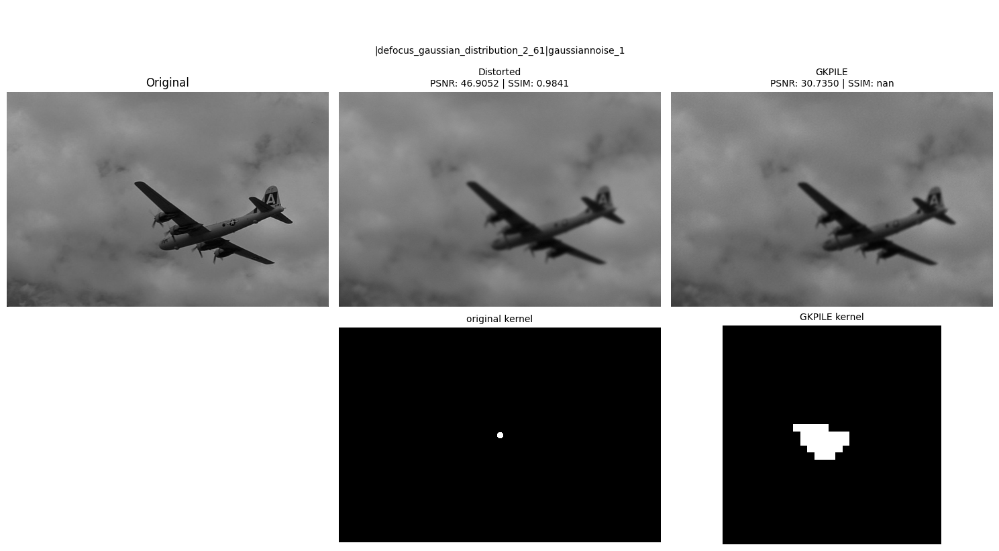

Удален файл: restored\3096_10_GKPILE_kernel.png
Удален файл: restored\3096_10_GKPILE.png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_LuczengMotionBlur)
#просто винер с заданным ядром???
#это даже я делал

0.06666667
SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_WienerMotionBlur_1.png (PSNR: 10.42, SSIM: nan)


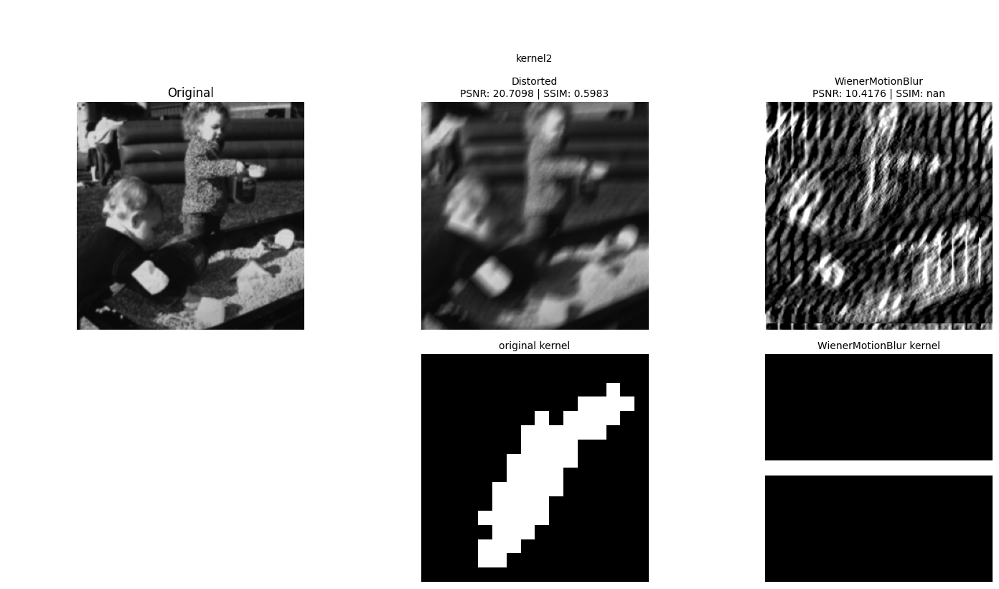

Удален файл: restored\im1_kernel2_img_WienerMotionBlur_1.png
Удален файл: restored\im1_kernel2_img_WienerMotionBlur_kernel_1.png


In [ ]:
frame.show(kernel_intencity_scale=100000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_MaxMBImageRestorationWienerBlind)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_MaxMBWienerBlind.png (PSNR: 21.58, SSIM: nan)


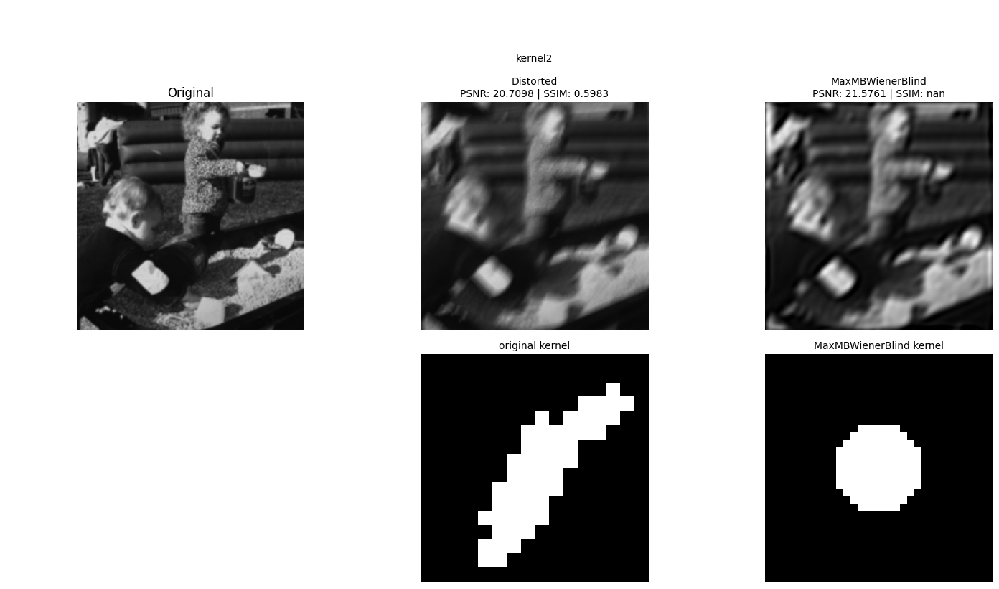

Удален файл: restored\im1_kernel2_img_MaxMBWienerBlind.png
Удален файл: restored\im1_kernel2_img_MaxMBWienerBlind_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
frame.process(alg_MuhammadhamzaazharImageEnhancementFilters)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_WienerFilter.png (PSNR: 20.20, SSIM: nan)


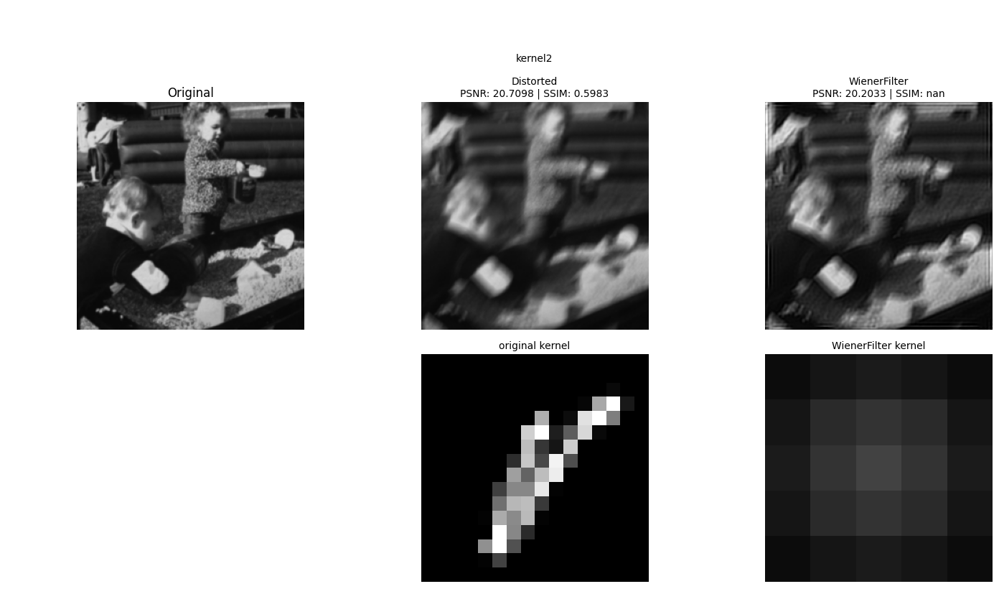

Удален файл: restored\im1_kernel2_img_WienerFilter.png
Удален файл: restored\im1_kernel2_img_WienerFilter_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=3.0)
frame.clear_restored()

In [ ]:
frame.process(alg_TianyishanBlindDeconvolutionDeconvolutionAlgorithm)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_PRIDA.png (PSNR: 12.48, SSIM: nan)


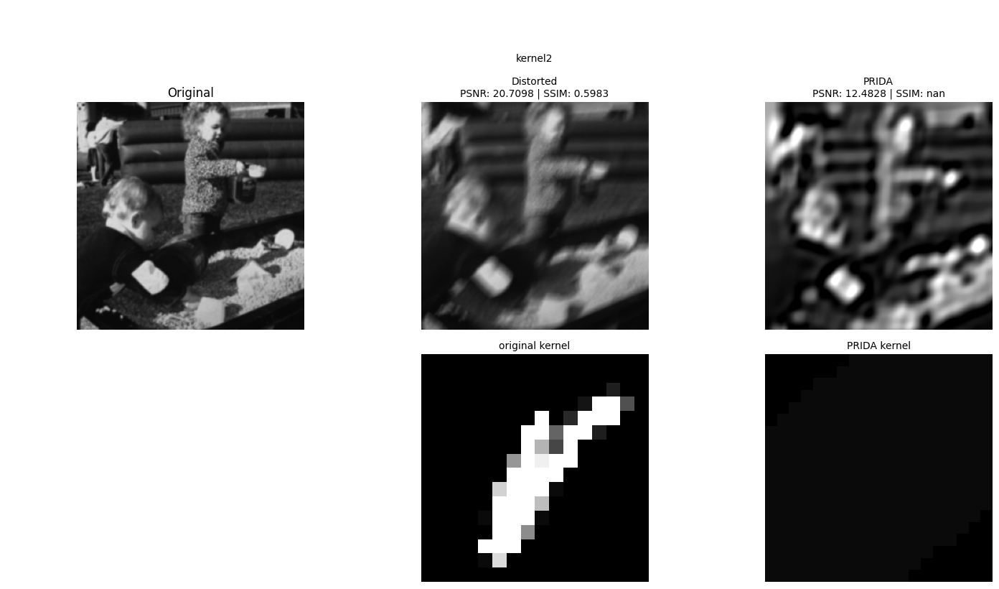

Удален файл: restored\im1_kernel2_img_PRIDA.png
Удален файл: restored\im1_kernel2_img_PRIDA_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=10.0)
frame.clear_restored()

In [ ]:
frame.process(alg_TmodrzykRichardsonLucyPython)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_RichardsonLucyTorchV2.png (PSNR: 16.24, SSIM: nan)


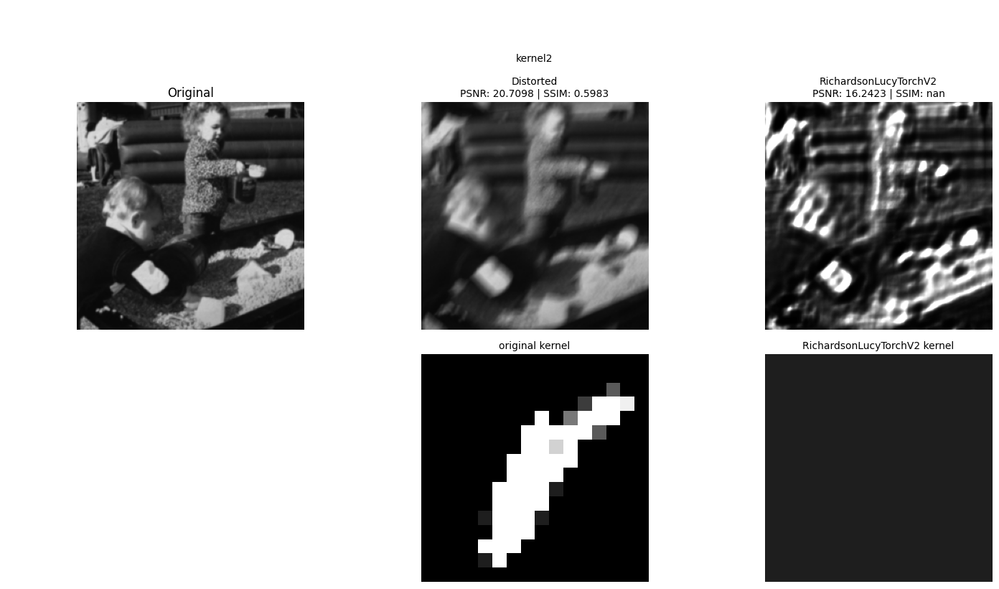

Удален файл: restored\im1_kernel2_img_RichardsonLucyTorchV2.png
Удален файл: restored\im1_kernel2_img_RichardsonLucyTorchV2_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=30.0)
frame.clear_restored()

In [ ]:
frame.process(alg_TobiasWolfMathBlindDeconvolutionMHDM)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_MHDM.png (PSNR: 14.95, SSIM: nan)


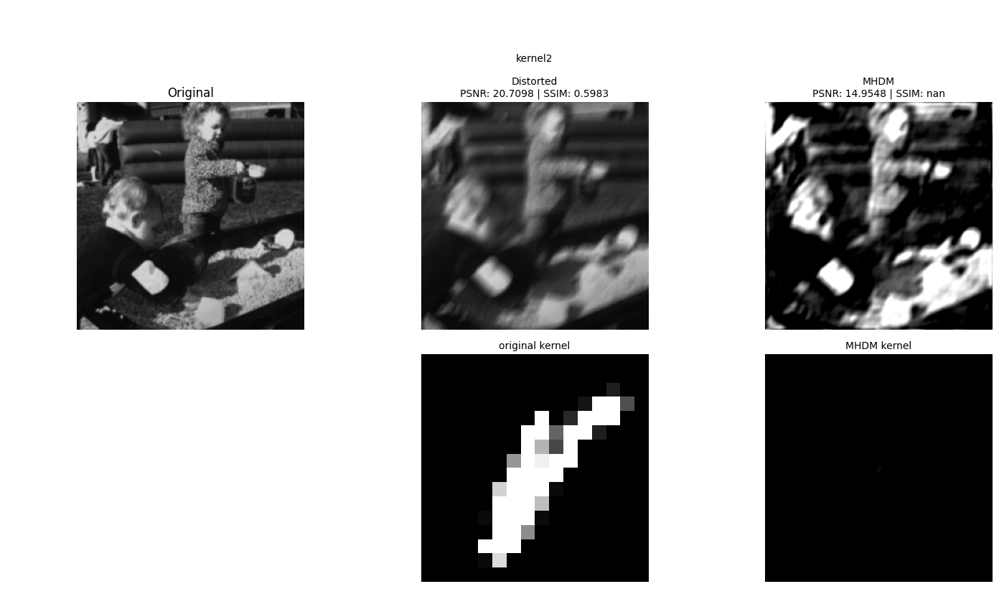

Удален файл: restored\im1_kernel2_img_MHDM_kernel.png
Удален файл: restored\im1_kernel2_img_MHDM.png


In [ ]:
frame.show(kernel_intencity_scale=10.0)
frame.clear_restored()

In [ ]:
frame.process(alg_TV1DeconvolutionAlgorithm)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_PoissonTV-TV1.png (PSNR: 4.62, SSIM: nan)


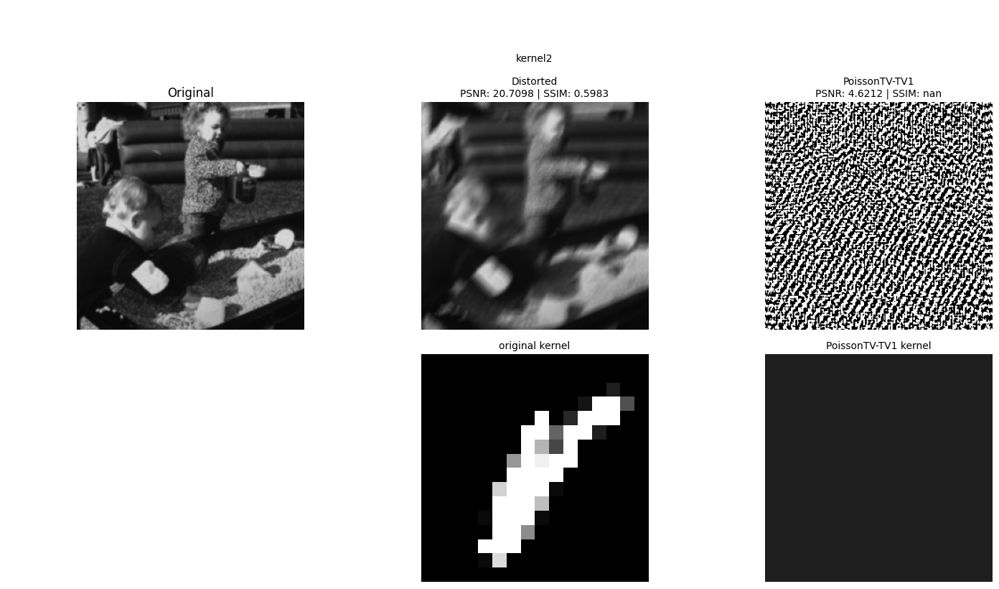

Удален файл: restored\im1_kernel2_img_PoissonTV-TV1.png
Удален файл: restored\im1_kernel2_img_PoissonTV-TV1_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=10.0)
frame.clear_restored()

In [ ]:
frame.process(alg_VipgugrBCDSAR)

PSNR calculation error: Input images must have the same dimensions.
SSIM calculation error: Input images must have the same dimensions.
Restored: im1_kernel2_img_BCDHE.png (PSNR: nan, SSIM: nan)


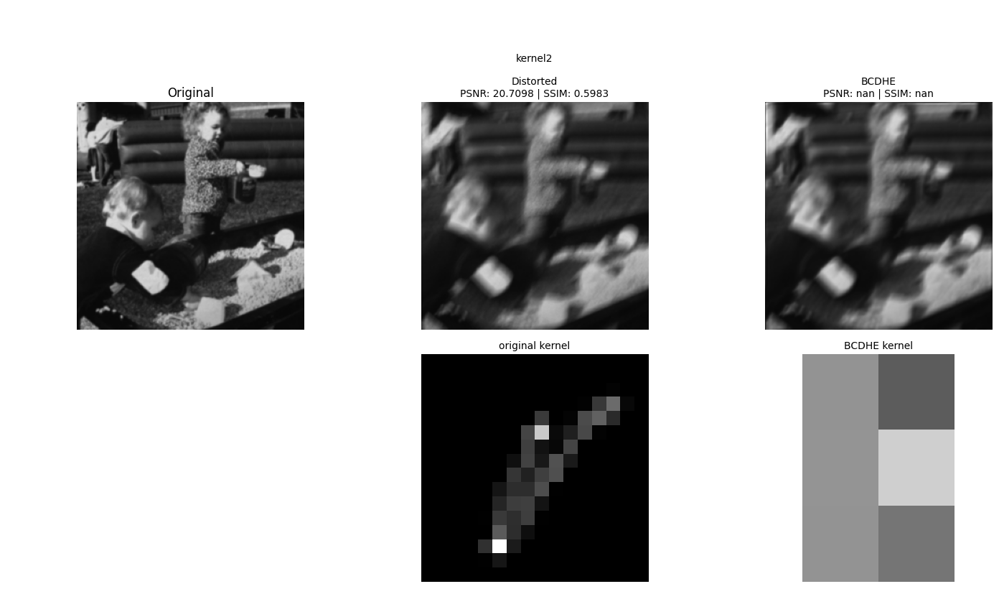

Удален файл: restored\im1_kernel2_img_BCDHE_kernel.png
Удален файл: restored\im1_kernel2_img_BCDHE.png


In [ ]:
frame.show(kernel_intencity_scale=1.0)
frame.clear_restored()

In [ ]:
frame.process(alg_WarrenzhaBlindDeconvolution)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_ZhaoBlindDeconv.png (PSNR: 9.21, SSIM: nan)


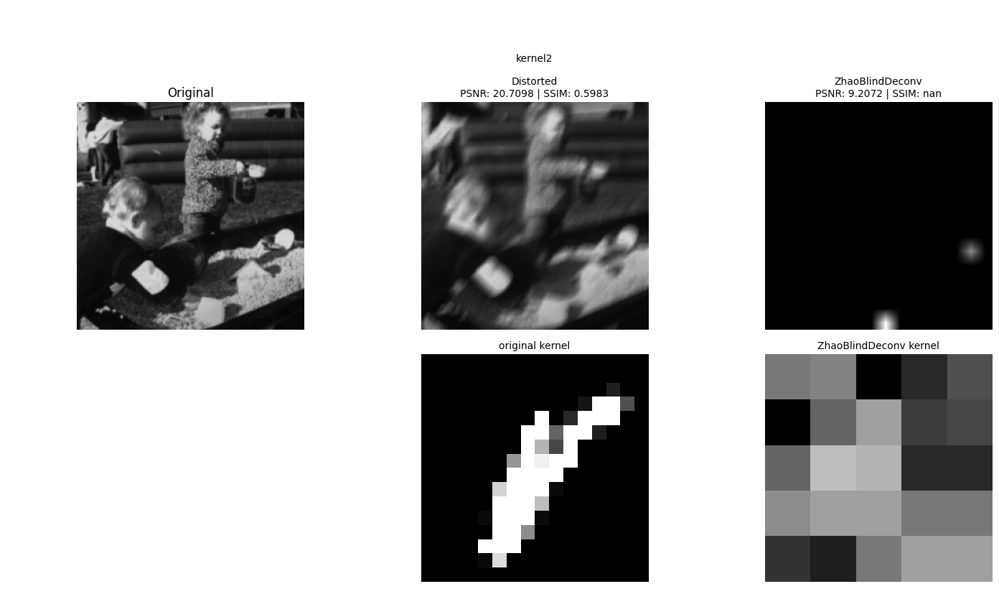

Удален файл: restored\im1_kernel2_img_ZhaoBlindDeconv.png
Удален файл: restored\im1_kernel2_img_ZhaoBlindDeconv_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=10.0)
frame.clear_restored()

In [ ]:
frame.process(alg_23ms410BlindDeconvolution)

SSIM calculation error: win_size exceeds image extent. Either ensure that your images are at least 7x7; or pass win_size explicitly in the function call, with an odd value less than or equal to the smaller side of your images. If your images are multichannel (with color channels), set channel_axis to the axis number corresponding to the channels.
Restored: im1_kernel2_img_ADMM23ms410.png (PSNR: 19.54, SSIM: nan)


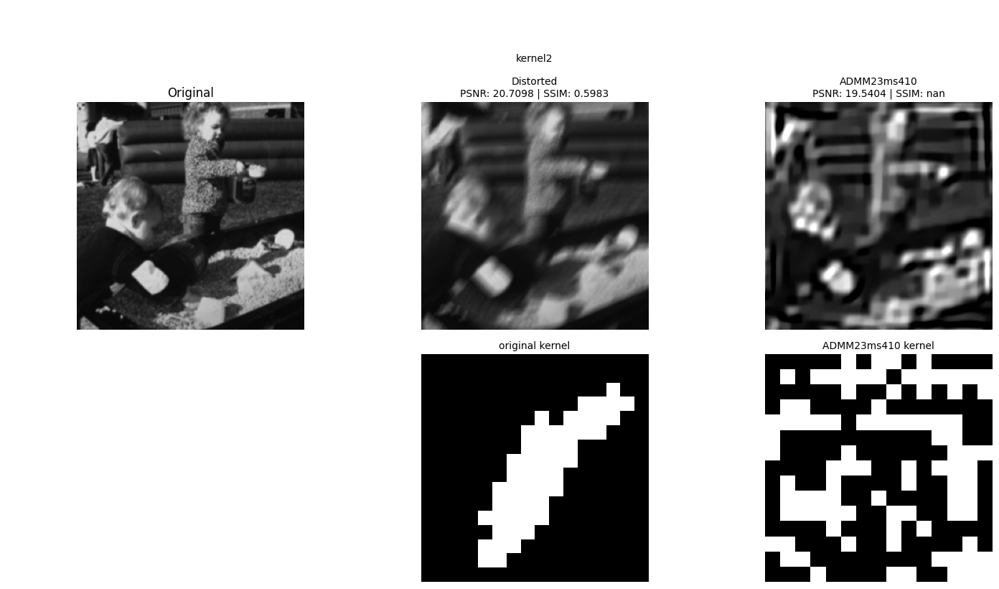

Удален файл: restored\im1_kernel2_img_ADMM23ms410.png
Удален файл: restored\im1_kernel2_img_ADMM23ms410_kernel.png


In [ ]:
frame.show(kernel_intencity_scale=1000.0)
frame.clear_restored()

In [ ]:
#почистим за собой директорию
# frame.clear_output() #удаляет все привязанные отфильрованные и восстановленные картинки
# frame.reset() #в теории убирает привязку к отфильтрованным и восстановленным картинкам
# frame.clear_input() #убирает привязку ко всем загруженным картинкам (загружать надо заново)

Удален файл: restored\3096_3_VioletBD_kernel.png
Удален файл: restored\3096_3_PoissonTV-TV1_kernel.png
Удален файл: restored\3096_3_MaxMBWienerBlind.png
Удален файл: restored\3096_3_FunsearchRLStopping.png
Удален файл: restored\3096_3_MHDM_kernel.png
Удален файл: restored\3096_3_BCDHE_kernel.png
Удален файл: restored\3096_3_HQMBR.png
Удален файл: restored\3096_3_EMBlindDeconvolution.png
Удален файл: restored\3096_3_Blind Deconvolution through a Single Image.png
Удален файл: restored\3096_3_Shan_kernel.png
Удален файл: restored\3096_3_PRIDA_kernel.png
Удален файл: restored\3096_3_TotalVariationBlindTV.png
Удален файл: restored\3096_3_FunsearchRLStopping_kernel.png
Удален файл: restored\3096_3_PoissonTV-TV1.png
Удален файл: restored\3096_3_BCDHE.png
Удален файл: restored\3096_3_WienerMotionBlur_kernel.png
Удален файл: restored\3096_3_MHDM.png
Удален файл: restored\3096_3_HQMBR_kernel.png
Удален файл: blured\kernel_3096_3.png
Удален файл: restored\3096_3_High-Quality Motion Deblurring (gp

In [ ]:
#почистим за собой директорию
# frame.clear_restored()